In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df= pd.read_csv('C:/Users/Dell/PycharmProjects/AQIndex/Data/Real-Data/real_comb.csv')

In [3]:
df.head()

,T,TM,Tm,H,W,V,VM,PM2.5
0,23.4,30.3,19.0,59.0,6.3,4.3,5.4,284.795833
1,22.4,30.3,16.9,57.0,6.9,3.3,7.6,219.720833
2,24.0,31.8,16.9,51.0,6.9,2.8,5.4,182.187500
3,22.8,30.2,17.6,55.0,7.7,3.7,7.6,154.037500
4,23.1,30.6,17.4,46.0,6.9,3.3,5.4,223.208333


In [129]:
df.isnull().sum()

T        0
TM       0
Tm       0
H        0
W        0
V        0
VM       0
PM2.5    0
dtype: int64

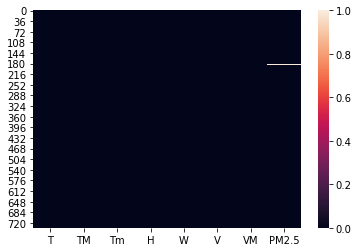

In [5]:
sns.heatmap(df.isnull())

In [13]:
df.dropna(inplace= True)

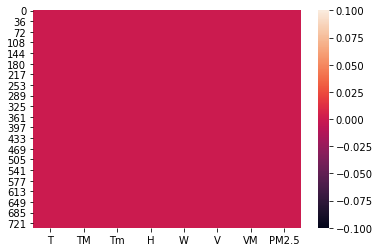

In [14]:
sns.heatmap(df.isnull())

In [20]:
x=  df.iloc[:, :-1]
y= df.iloc[:,-1]

In [21]:
x.isnull().sum()

T     0
TM    0
Tm    0
H     0
W     0
V     0
VM    0
dtype: int64

In [22]:
y.isnull().sum()

0

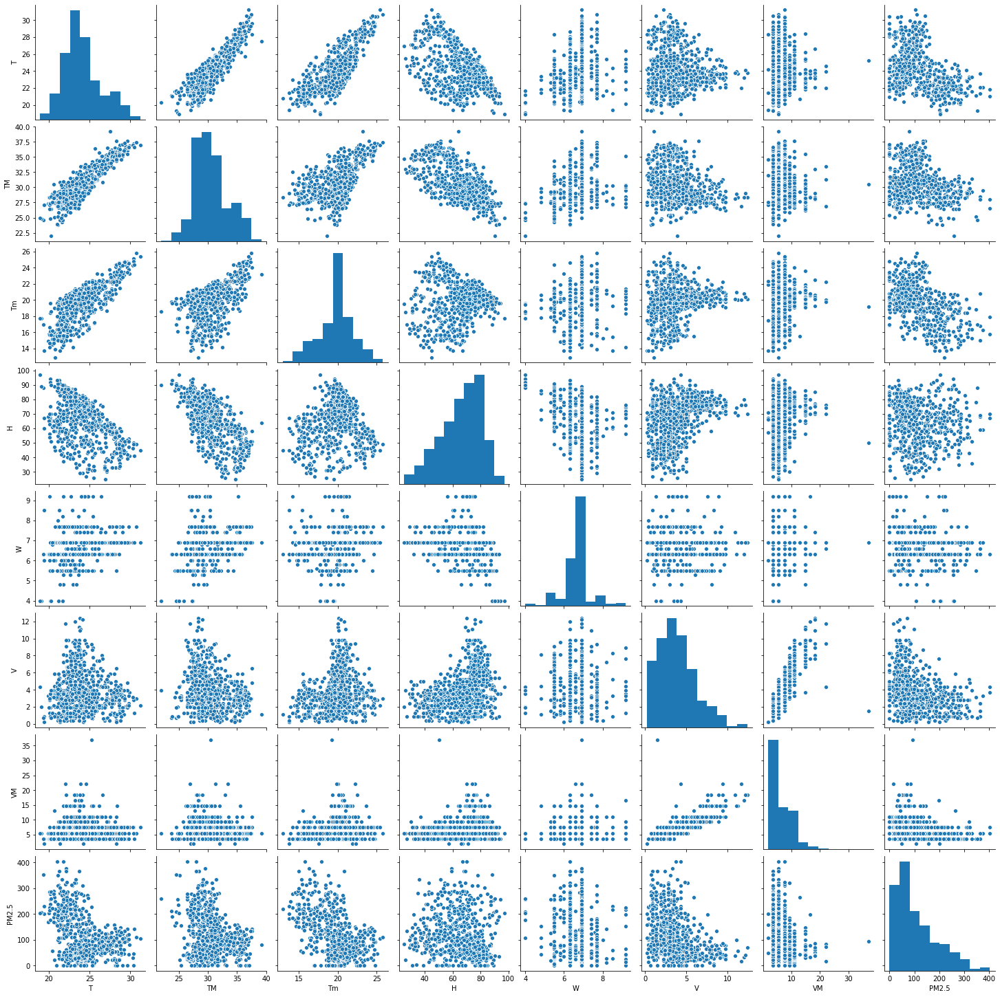

In [23]:
sns.pairplot(df)

In [16]:
df.corr()

,T,TM,Tm,H,W,V,VM,PM2.5
T,1.000000,0.882433,0.772471,-0.479727,0.298138,-0.060587,-0.022747,-0.370754
TM,0.882433,1.000000,0.512705,-0.659010,0.275448,-0.233228,-0.160021,-0.194339
Tm,0.772471,0.512705,1.000000,0.101630,0.102964,0.217269,0.196513,-0.519450
H,-0.479727,-0.659010,0.101630,1.000000,-0.282130,0.380803,0.299179,-0.189129
W,0.298138,0.275448,0.102964,-0.282130,1.000000,0.020445,0.007957,-0.138311
V,-0.060587,-0.233228,0.217269,0.380803,0.020445,1.000000,0.792492,-0.402463
VM,-0.022747,-0.160021,0.196513,0.299179,0.007957,0.792492,1.000000,-0.339834
PM2.5,-0.370754,-0.194339,-0.519450,-0.189129,-0.138311,-0.402463,-0.339834,1.000000


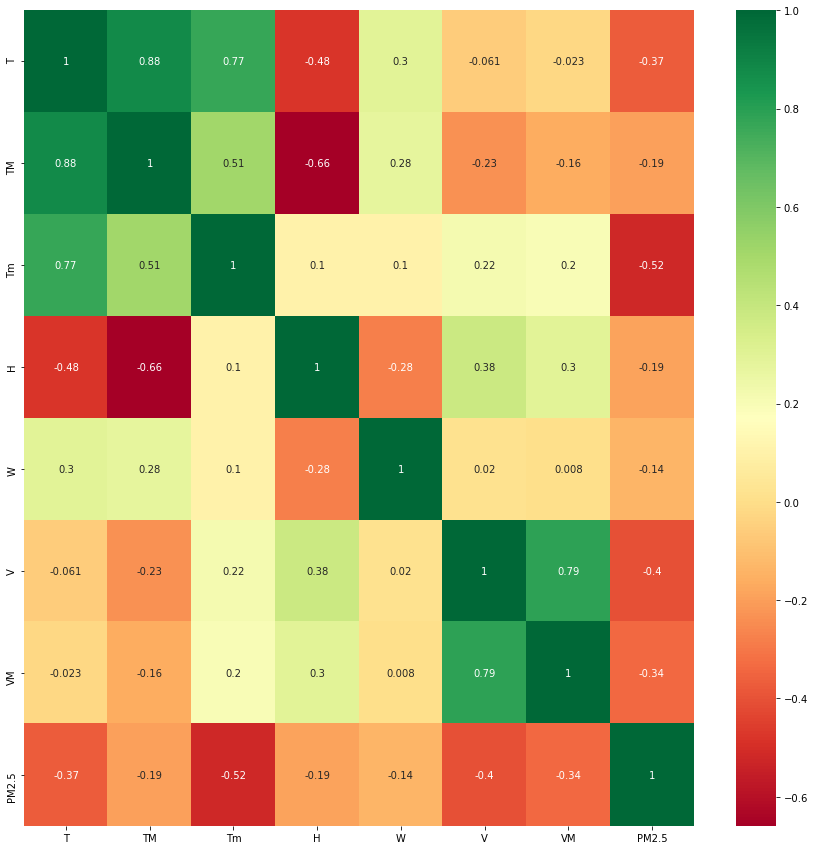

In [21]:
plt.figure(figsize = (15,15))
sns.heatmap(df.corr(), annot=True,cmap="RdYlGn")

In [24]:
from sklearn.ensemble import ExtraTreesRegressor
extra= ExtraTreesRegressor()

In [25]:
extra.fit(x,y)

ExtraTreesRegressor()

In [47]:
extra.feature_importances_

array([0.20234824, 0.11846952, 0.25656489, 0.10778371, 0.07258772,
       0.17121673, 0.07102919])

In [26]:
feat= extra.feature_importances_

In [27]:
feat1=pd.Series(feat, index=x.columns)

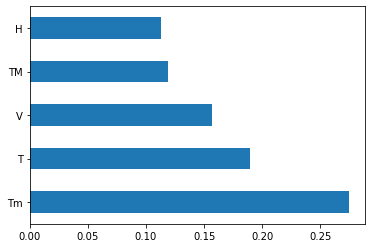

In [28]:
feat1.nlargest(5).plot(kind='barh')

In [43]:
feat1

T     0.202348
TM    0.118470
Tm    0.256565
H     0.107784
W     0.072588
V     0.171217
VM    0.071029
dtype: float64

## Decision Tree Regressor

In [29]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test= train_test_split(x,y, test_size=0.3, random_state=2)

In [30]:
from sklearn.tree import DecisionTreeRegressor

In [31]:
dtree= DecisionTreeRegressor()

In [32]:
dtree.fit(x_train,y_train)

DecisionTreeRegressor()

In [33]:
dtree.score(x_train,y_train)

1.0

In [34]:
dtree.score(x_test,y_test)  

-0.01745960835621463

##### R2 for Train is 1 and R2 for test is going Negative implies an overfitting case and worse model fit

###### doing CrossValidation to see if the overfitting removes (instead of train test split)

In [35]:
from sklearn.model_selection import cross_val_score

score= cross_val_score(dtree,x,y,cv=5)

In [36]:
score.mean()

-0.2628342664746806

##### The R squared comes out to be -0.22 that is even worse

In [37]:
prediction=dtree.predict(x_test)

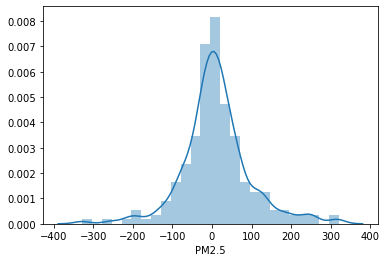

In [38]:
sns.distplot(y_test-prediction)

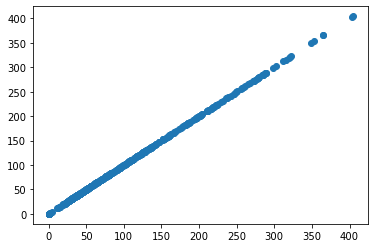

In [102]:
pred = dtree.predict(x_train)
plt.scatter(y_train, pred) # More linear the line is implies prediction same as y_test this means lower error

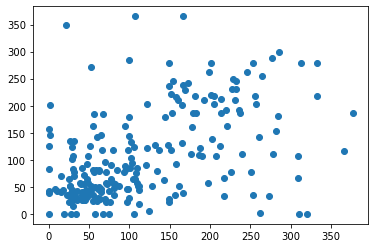

In [104]:
plt.scatter(y_test, prediction) # More linear the line is implies prediction same as y_test this means lower error

In [40]:
##conda install pydotplus
## conda install python-graphviz

from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [44]:
features= list(df.columns[:-1])

In [187]:
import os
os.environ['PATH']= os.environ['PATH'] + ';' + os.environ['CONDA_PREFIX'] + r"\Library\bin\graphviz" 

In [45]:
features

['T', 'TM', 'Tm', 'H', 'W', 'V', 'VM']

In [46]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [47]:
dot_data

### Applying Hyperparameter Tuning  - GridSearcCV

In [130]:
dt= DecisionTreeRegressor()

In [131]:
dt.feature_importances_

NotFittedError: This DecisionTreeRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [50]:
dtree.max_features_

7

In [132]:
### Parameters

params= {'criterion': ["mse", "friedman_mse", "mae"], 'splitter' : ['best', 'random'], 'max_depth': [4,6,8,10,12,15],
         'min_samples_split': [3,4,5,6], 'min_samples_leaf': [2,3,4,5], 'min_impurity_split': [2,4,6,8,10], 
         'max_features' : ["auto", "sqrt", "log2"], 'min_weight_fraction_leaf': [0.1, 0.3,0.5,0.9],
             }

In [70]:
from sklearn.model_selection import GridSearchCV

In [133]:
G_sear= GridSearchCV(dt, param_grid=params, scoring= 'neg_mean_squared_error', n_jobs=-1,cv=5, verbose=3)

In [134]:
from datetime import datetime as dt

In [135]:
def timer(start_time=None):
    if start_time==None:
        start_time= dt.now()
        return start_time
    else:
        end_time= dt.now()
        time= (end_time-start_time).total_seconds()
        hour, tsec= divmod(time,3600)
        min, sec = divmod(tsec,60)
        print('Time taken to train is {} hours, {} minutes and {} second'.format(hour, min,sec))        

In [136]:
start_time= timer(None)
G_sear.fit(x,y)
timer(start_time)

Fitting 5 folds for each of 34560 candidates, totalling 172800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 996 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 3556 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 7140 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 11748 tasks      | elapsed:   49.0s
[Parallel(n_jobs=-1)]: Done 17380 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 24036 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 31716 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 40420 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 50148 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 60900 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 72676 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 85476 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 99300 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 114148

Time taken to train is 0.0 hours, 8.0 minutes and 20.798929999999984 second


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\tree\_classes.py:306: FutureWarning: The min_impurity_split parameter is deprecated. Its default value has changed from 1e-7 to 0 in version 0.23, and it will be removed in 0.25. Use the min_impurity_decrease parameter instead.
  warnings.warn("The min_impurity_split parameter is deprecated. "


In [146]:
G_sear.best_params_

{'criterion': 'mae',
 'max_depth': 4,
 'max_features': 'log2',
 'min_impurity_split': 4,
 'min_samples_leaf': 4,
 'min_samples_split': 3,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [138]:
G_sear.best_score_

-4156.725831302445

In [185]:
dtree2= DecisionTreeRegressor(criterion = 'mae',
 max_depth = 4,
 max_features= 'log2',
 min_impurity_split= 4,
 min_samples_leaf= 4,
 min_samples_split= 3,
 min_weight_fraction_leaf= 0.1,
 splitter= 'best')

In [186]:
dtree2.fit(x_train,y_train)

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\tree\_classes.py:306: FutureWarning: The min_impurity_split parameter is deprecated. Its default value has changed from 1e-7 to 0 in version 0.23, and it will be removed in 0.25. Use the min_impurity_decrease parameter instead.
  warnings.warn("The min_impurity_split parameter is deprecated. "


DecisionTreeRegressor(criterion='mae', max_depth=4, max_features='log2',
                      min_impurity_split=4, min_samples_leaf=4,
                      min_samples_split=3, min_weight_fraction_leaf=0.1)

In [187]:
dtree2.score(x_train,y_train)

0.3820506537196857

In [188]:
dtree2.score(x_test,y_test)

0.1720632080483513

In [143]:
dtree.score(x_train,y_train)

1.0

In [189]:
dtree.score(x_test,y_test)

-0.01745960835621463

#### We can see some imporvement in the model after applying the Hyper parameter tuning- Gridsearch CV

In [107]:
prediction2= dtree2.predict(x_test)

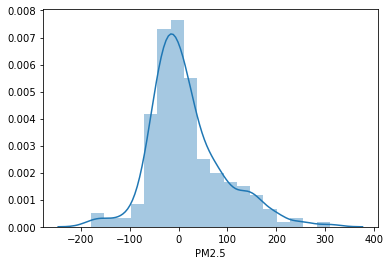

In [93]:
sns.distplot(y_test-prediction2)

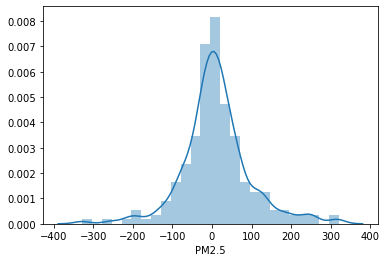

In [96]:
sns.distplot(y_test-prediction)

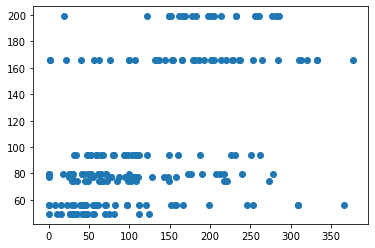

In [108]:
plt.scatter(y_test,prediction2) ### The graph implies total underfitting

In [112]:
from sklearn import metrics

In [117]:
print('MAE', metrics.mean_absolute_error(y_test,prediction2))
print('MSE', metrics.mean_squared_error(y_test,prediction2))
print('MSE', np.sqrt(metrics.mean_squared_error(y_test,prediction2)))

MAE 54.43042877548369
MSE 5906.399068355336
MSE 76.85310057736991


In [119]:
import pickle

In [125]:
file= open('DecisionTree.pkl', 'wb')

In [126]:
pickle.dump(G_sear,file)